# Synthetic Data for Machine Learning

this is an example of generating synthetic data based on a real dataset

In [1]:
#!pip install table_evaluator --user
#!pip install pandas-profiling[notebook]

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import sys
import seaborn as sns
import warnings
from time import time

from pandas_profiling import ProfileReport
from ctgan import CTGANSynthesizer
from sdv.evaluation import evaluate
from table_evaluator import TableEvaluator

from sklearn.exceptions import ConvergenceWarning, ConvergenceWarning, DataConversionWarning
warnings.filterwarnings("ignore",category=ConvergenceWarning)
warnings.filterwarnings("ignore",category=DataConversionWarning)
warnings.filterwarnings("ignore",category=UserWarning)
warnings.filterwarnings("ignore",category=FutureWarning)
warnings.filterwarnings("ignore",category=RuntimeWarning)

%matplotlib inline

## Read original data

In [2]:
# Input data files are available in the read-only "./dataset/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./dataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

df =pd.read_csv("./dataset/gt_full.csv", index_col=0)

./dataset\gt_full.csv


In [3]:
df.profile_report(progress_bar=False, title="Profiling Report")

## Statistical outliers


Let's take a quick look at statistical outliers

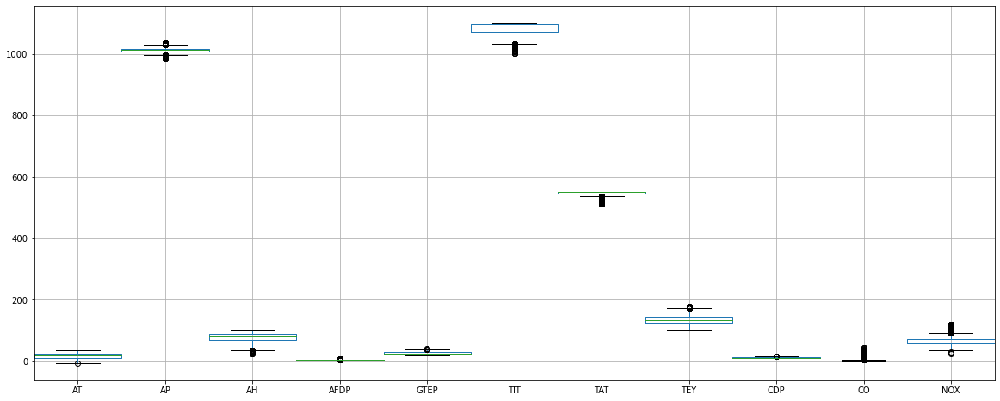

In [4]:
df.boxplot(figsize = (20, 8), widths = 1)
plt.show()

# Data synthesis

### CTGAN

let's create synthetic data based on real data using CTGAN.

In [10]:
original_data = df.copy()

start = time()
ctgan = CTGANSynthesizer(epochs=500, verbose = True)
ctgan.fit(original_data)

print("Model generation time: " + str(time()  - start))

Epoch 1, Loss G: -0.4241, Loss D:  0.0404
Epoch 2, Loss G: -0.8448, Loss D:  0.0126
Epoch 3, Loss G: -0.9777, Loss D: -0.0960
Epoch 4, Loss G: -1.3085, Loss D: -0.0270
Epoch 5, Loss G: -1.5119, Loss D: -0.1980
Epoch 6, Loss G: -1.5830, Loss D:  0.1551
Epoch 7, Loss G: -1.5807, Loss D:  0.0754
Epoch 8, Loss G: -1.5822, Loss D: -0.0898
Epoch 9, Loss G: -1.7215, Loss D: -0.0169
Epoch 10, Loss G: -1.8731, Loss D: -0.0456
Epoch 11, Loss G: -1.9503, Loss D:  0.1012
Epoch 12, Loss G: -1.7450, Loss D: -0.0842
Epoch 13, Loss G: -1.9543, Loss D:  0.0255
Epoch 14, Loss G: -1.7123, Loss D:  0.0150
Epoch 15, Loss G: -1.6559, Loss D: -0.1708
Epoch 16, Loss G: -1.4262, Loss D: -0.3802
Epoch 17, Loss G: -0.9730, Loss D: -0.3757
Epoch 18, Loss G: -0.6097, Loss D: -0.6325
Epoch 19, Loss G: -0.3655, Loss D: -0.2470
Epoch 20, Loss G: -0.2149, Loss D: -0.4952
Epoch 21, Loss G: -0.4685, Loss D: -0.6501
Epoch 22, Loss G: -0.4908, Loss D: -0.6096
Epoch 23, Loss G: -0.5235, Loss D: -0.5837
Epoch 24, Loss G: -0

In [11]:
ctgan.save('gas_model.pkl')

generate a new record

In [12]:
n_ctgan_generated_data = 100000
synthetic_data = ctgan.sample(n_ctgan_generated_data)

In [13]:
score = evaluate(original_data, synthetic_data, aggregate=False, metrics=['KSTest'])
score

,metric,name,raw_score,normalized_score,min_value,max_value,goal,error
0,KSTest,Inverted Kolmogorov-Smirnov D statistic,0.945889,0.945889,0.0,1.0,MAXIMIZE,None


let's build a report

(36733, 11) (100000, 11)


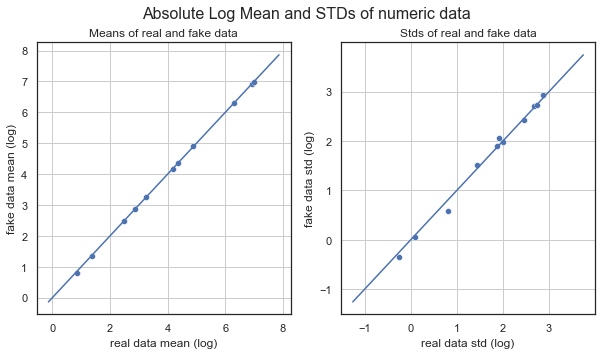

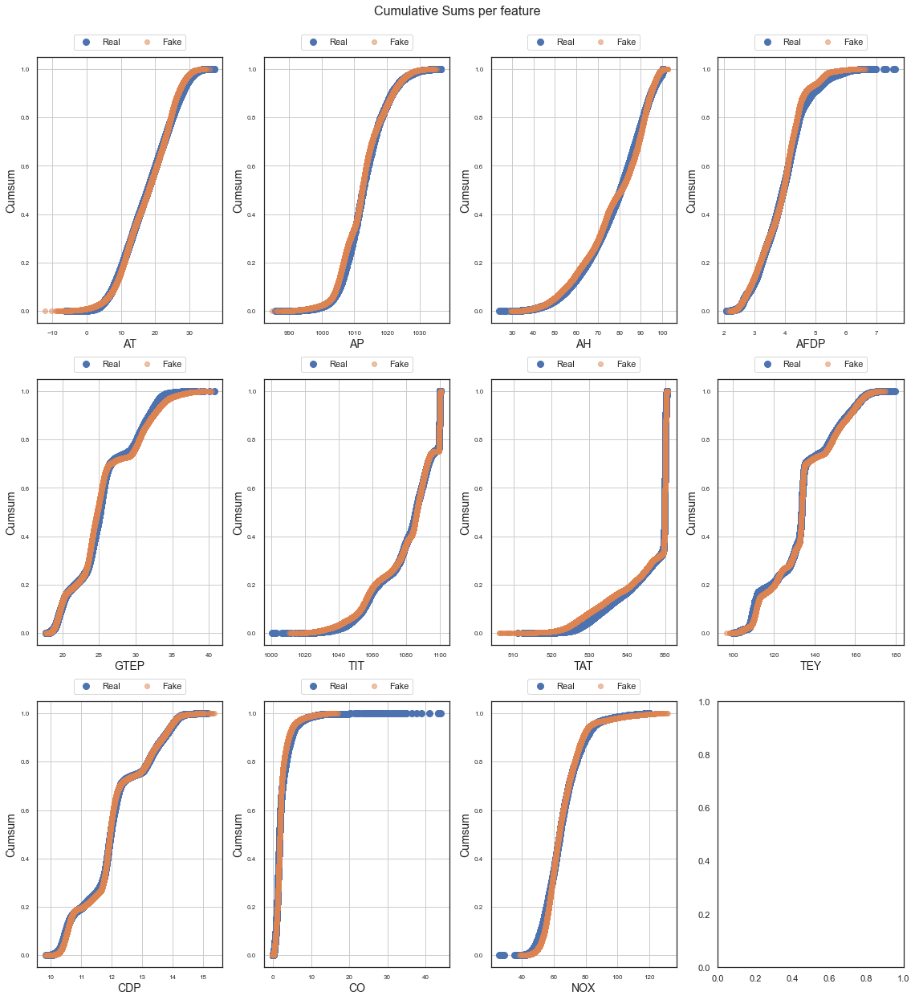

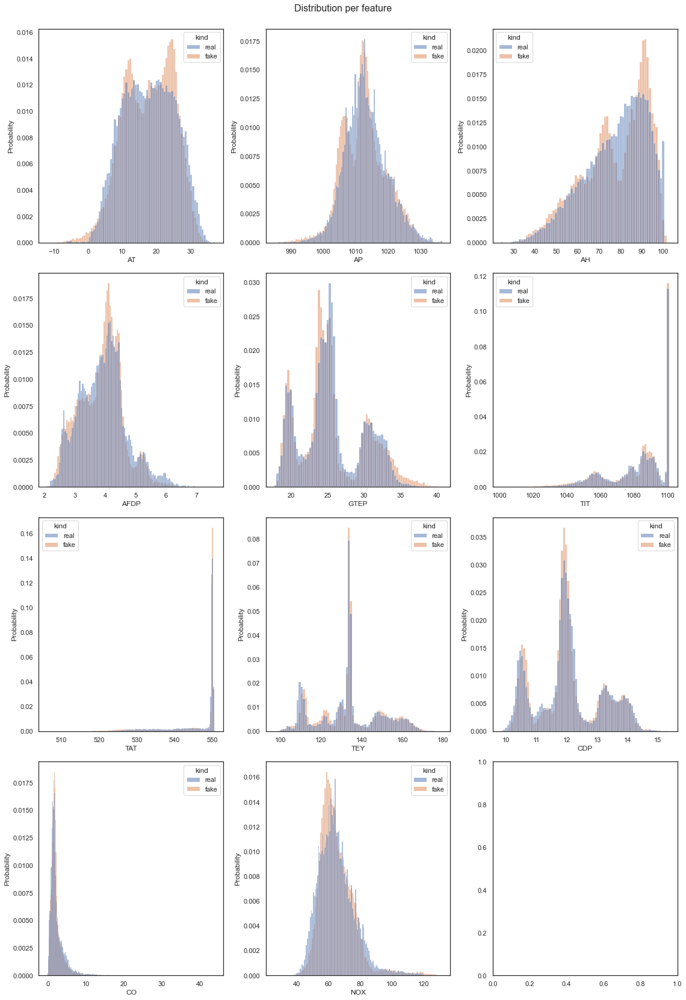

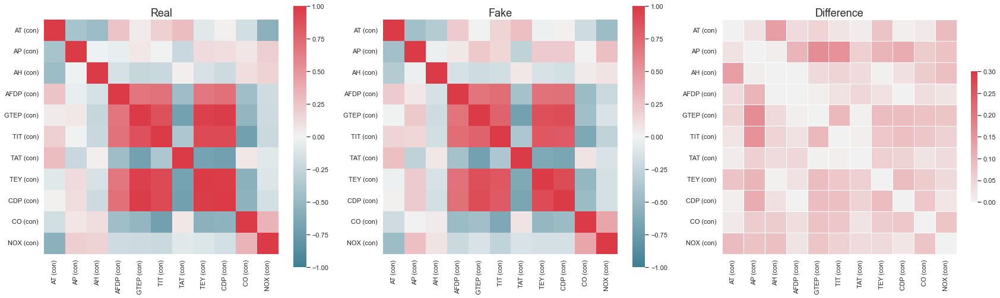

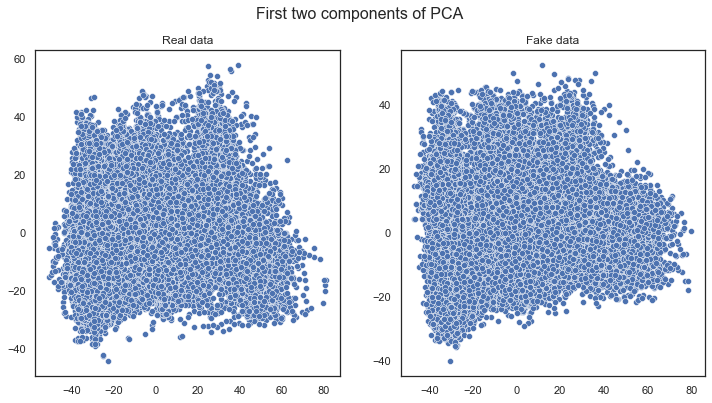

In [15]:
def build_report(original, fake):
    
    orig_data = original.copy()
    fake = fake.copy()
    
    # bug 
    max_index = orig_data.index.max()
    fake.index = range(max_index+1,len(fake)+max_index+1,1)
    # /bug fix

    print(orig_data.shape, fake.shape)
    table_evaluator =  TableEvaluator(orig_data, fake)
    table_evaluator.visual_evaluation()

build_report(original_data, synthetic_data)